# Annual Chl Avgs

Ocean Science Manuscript: Figures B4 & B8

LJK

Last edited: 12/20/24

In [1]:
from config import *
import xarray as xr
import numpy as np
from IPython.display import Image, display
import matplotlib.pyplot as plt

In [2]:
fontsize = 18

plt.rc('font', size=fontsize)          # controls default text sizes
plt.rc('axes', titlesize=fontsize)     # fontsize of the axes title
plt.rc('axes', labelsize=fontsize)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=fontsize)    # fontsize of the tick labels
plt.rc('ytick', labelsize=fontsize)    # fontsize of the tick labels
plt.rc('legend', fontsize=fontsize)    # legend fontsize
plt.rc('figure', titlesize=fontsize)  # fontsize of the figure title

In [3]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

In [4]:
lon1,lon2 = 180,230
lat1,lat2 = 15,30

chl_dir = project_output_dir + 'OCCCI_8day_v6.0_bounding_box/' 
sample_chl_file = 'ESACCI-OC-L3S-CHLOR_A-MERGED-8D_DAILY_4km_GEO_PML_OCx-20100101-fv6.0_bounding_box.nc'
chl_data = xr.open_dataset(chl_dir + sample_chl_file)
chl_lat1,chl_lat2 = find_nearest(chl_data.lat,lat1),find_nearest(chl_data.lat,lat2)
chl_lon1,chl_lon2 = find_nearest(chl_data.lon,lon1 - 360),find_nearest(chl_data.lon,lon2 - 360) #NOTE: this code works if all data is to the east of -180, need to fix if looking west of -180/180
chl_lat_array = np.array(chl_data.lat)[chl_lat2:chl_lat1][::-1] #chl data gets read in opposite order so you have to fix it
chl_lon_array = np.array(chl_data.lon)[chl_lon1:chl_lon2] + 360

In [5]:
chl_data

<xarray.Dataset>
Dimensions:             (lat: 600, lon: 1560, time: 1)
Coordinates:
  * lat                 (lat) float64 34.98 34.94 34.9 ... 10.1 10.06 10.02
  * lon                 (lon) float64 -180.0 -179.9 -179.9 ... -115.1 -115.0
  * time                (time) datetime64[ns] 2010-01-01
Data variables:
    MERIS_nobs_sum      (time, lat, lon) float32 ...
    MODISA_nobs_sum     (time, lat, lon) float32 ...
    OLCI-A_nobs_sum     (time, lat, lon) float32 ...
    OLCI-B_nobs_sum     (time, lat, lon) float32 ...
    SeaWiFS_nobs_sum    (time, lat, lon) float32 ...
    VIIRS_nobs_sum      (time, lat, lon) float32 ...
    chlor_a             (time, lat, lon) float32 ...
    chlor_a_log10_bias  (time, lat, lon) float32 ...
    chlor_a_log10_rmsd  (time, lat, lon) float32 ...
    crs                 (lat, lon) float64 ...
    total_nobs_sum      (time, lat, lon) float32 ...
Attributes:
    Conventions:                       CF-1.7
    Metadata_Conventions:              Unidata Dataset Discovery v1.0
    cdm_data_type:                     Grid
    comment:                           See summary attribute
    creator_email:                     help@esa-oceancolour-cci.org
    creator_name:                      Plymouth Marine Laboratory
    creator_url:                       http://esa-oceancolour-cci.org
    geospatial_lat_max:                90.0
    geospatial_lat_min:                -90.0
    geospatial_lat_resolution:         .04166666666666666666
    geospatial_lat_units:              decimal degrees north
    geospatial_lon_max:                180.0
    geospatial_lon_min:                -180.0
    geospatial_lon_resolution:         .04166666666666666666
    geospatial_lon_units:              decimal degrees east
    geospatial_vertical_max:           0.0
    geospatial_vertical_min:           0.0
    git_commit_hash:                   4db7bf1d93d4acce920d50186c81b2052007f64a
    institution:                       Plymouth Marine Laboratory
    keywords:                          satellite,observation,ocean,ocean colour
    keywords_vocabulary:               none
    license:                           ESA CCI Data Policy: free and open acc...
    naming_authority:                  uk.ac.pml
    number_of_bands_used_to_classify:  4
    number_of_optical_water_types:     14
    platform:                          Orbview-2,Aqua,Envisat,Suomi-NPP, Sent...
    processing_level:                  Level-3
    product_version:                   6.0
    project:                           Climate Change Initiative - European S...
    references:                        http://www.esa-oceancolour-cci.org/
    sensor:                            SeaWiFS,MODIS,MERIS,VIIRS,OLCI
    sensors_present:                    MERIS MODISA SeaWiFS
    spatial_resolution:                4km nominal at equator
    standard_name_vocabulary:          NetCDF Climate and Forecast (CF) Metad...
    title:                             ESA CCI Ocean Colour Product
    NCO:                               netCDF Operators version 4.7.5 (Homepa...
    number_of_files_composited:        8
    creation_date:                     Tue Aug 16 18:51:48 2022
    date_created:                      Tue Aug 16 18:51:48 2022
    time_coverage_resolution:          P8D
    time_coverage_duration:            P8D
    start_date:                        01-JAN-2010 00:00:00.000000
    stop_date:                         08-JAN-2010 23:59:00.000000
    time_coverage_start:               201001010000Z
    time_coverage_end:                 201001082359Z
    history:                           Source data were: ESACCI-OC-L3S-OC_PRO...
    netcdf_file_type:                  NETCDF4_CLASSIC
    id:                                ESACCI-OC-L3S-CHLOR_A-MERGED-8D_DAILY_...
    source:                            NASA SeaWiFS  L1A and L2 R2018.0 LAC a...
    summary:                           Data products generated by the Ocean C...
    tracking_id:                       c8528d46-334d-4c2c-b

In [6]:
clim_dir = project_output_dir + 'OCCCI_8day_v6.0_climatologies/'
months = ['JAN','FEB','MAR','APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC']

chl_month_clim = []
for month_ind in np.arange(0,len(months)):
    temp = np.load(clim_dir + 'ESACCI-OC-L3S-CHLOR_A-MERGED-8D_DAILY_4km_GEO_PML_OCx-fv6.0_bounding_box_%s_AVG.npy'%(months[month_ind]))     
    chl_month_clim.append(temp[chl_lat2:chl_lat1,chl_lon1:chl_lon2][::-1])

In [7]:
np.nanmean(chl_month_clim)

0.06751925

In [8]:
print(np.shape(chl_month_clim[0]))
print(np.shape(chl_lat_array))
print(np.shape(chl_lon_array))

(360, 1200)
(360,)
(1200,)


In [9]:
print(np.nanmedian(chl_month_clim[0]))
print(np.nanmin(chl_month_clim[0]))
print(np.nanmax(chl_month_clim[0]))

0.0802208
0.024234409
8.234009


Get the min & max chlorophyll in any domain

In [10]:
abs_min,abs_max = 100,0
for m in np.arange(0,12):    
    if np.nanmin(chl_month_clim[m]) < abs_min:
        abs_min = np.nanmin(chl_month_clim[m])
    if np.nanmax(chl_month_clim[m]) > abs_max:
        abs_max = np.nanmax(chl_month_clim[m])
        
print(abs_min)
print(abs_max)

0.00911393
12.248362


/home/jonesae/.conda/envs/py3_parcels_v2/lib/python3.6/site-packages/ipykernel_launcher.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator


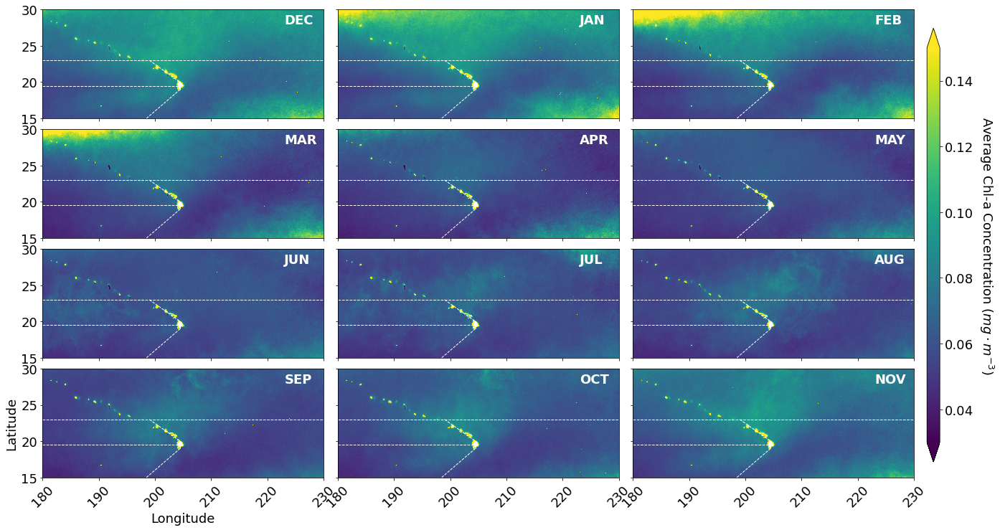

In [11]:
vmin,vmax= 0.03,0.15

fig, ax = plt.subplots(4,3,figsize=(25,12))
plt.subplots_adjust(wspace=0.05, hspace=0.1) # make plots closer together

def plot_row_by_season(row_ind,array_of_months):
    i = 0
    for m in array_of_months:
        plot = ax[row_ind,i].pcolormesh(chl_lon_array,chl_lat_array,chl_month_clim[m],shading='nearest',vmin=vmin,vmax=vmax)
        #ax[row_ind,i].set_title(months[m])
        ax[row_ind,i].text(223,28,months[m],color='w',fontweight='bold')
        
        # PROVINCES LINES #
        linewidth=1
        ax[row_ind,i].axhline(23,color='w',linewidth=linewidth,linestyle='--')
        ax[row_ind,i].axhline(19.5,xmax=0.49,color='w',linewidth=linewidth,linestyle='--')
        ax[row_ind,i].plot([199,204.5],[23,20],color='w',linewidth=linewidth,linestyle='--') # top of cyclones
        ax[row_ind,i].plot([198.5,204.5],[15,19],color='w',linewidth=linewidth,linestyle='--') # bottom of anticycs
        ax[row_ind,i].plot([204.5,204.5],[19,20],color='w',linewidth=linewidth,linestyle='--')
        i += 1
    return plot
    
plot = plot_row_by_season(0,[11,0,1]) # Winter
plot = plot_row_by_season(1,[2,3,4]) # Spring
plot = plot_row_by_season(2,[5,6,7]) # Summer
plot = plot_row_by_season(3,[8,9,10]) # Fall

# Colorbar
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.81, 0.15, 0.01, 0.7]) #[left, bottom, width, height]
fig.colorbar(plot, cax=cbar_ax, extend='both')
cbar_ax.set_ylabel('Average Chl-a Concentration ($mg \cdot m^{-3}$)', rotation=270)
cbar_ax.get_yaxis().labelpad = 30
    
for row in np.arange(0,4):
    for col in np.arange(0,3):
        if row<3:
            ax[row,col].set_xticklabels([])
        else:
            ax[row,col].set_xticklabels(['180','190','200','210','220','230'],rotation=45)
        if col>0:
            ax[row,col].set_yticklabels([])        

ax[3,0].set_ylabel('Latitude',)
ax[3,0].set_xlabel('Longitude')  

#plt.show()

save_dir = project_output_dir + 'RCLV_CHL_PAPER_FIGS/'
#plt.savefig(save_dir + 'domain_monthly_mean_chl_2000_2019_r1.png', format='png', dpi=350)

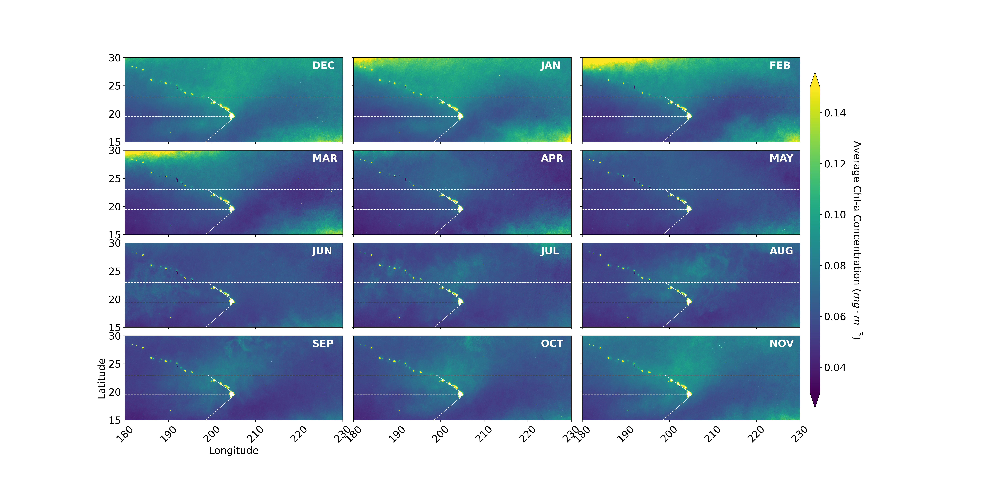

In [12]:
display(Image(filename=save_dir + 'domain_monthly_mean_chl_2000_2019_r1.png'))

## Get Seasonal Chl Averages by Province

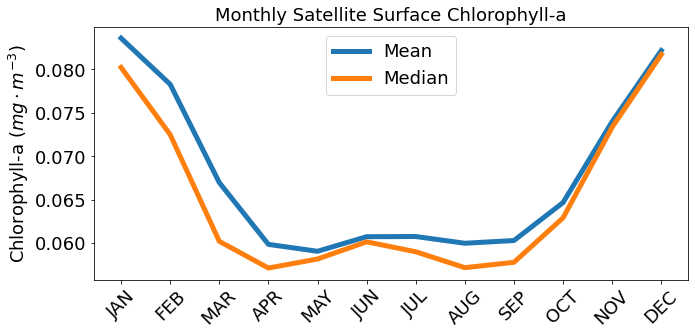

In [13]:
linewidth=5
fig, ax = plt.subplots(1,1,figsize=(10,5))

monthly_mean,monthly_median = [],[]
for i in np.arange(0,len(chl_month_clim)):
    monthly_chl = chl_month_clim[i]
    monthly_mean.append(np.nanmean(monthly_chl))
    monthly_median.append(np.nanmedian(monthly_chl))

ax.plot(monthly_mean,linewidth=linewidth,label='Mean')
ax.plot(monthly_median,linewidth=linewidth,label='Median')

ax.set_ylabel('Chlorophyll-a ($mg \cdot m^{-3}$)')
ax.set_xticks(np.arange(0,12))
ax.set_xticklabels(months,rotation=45)
ax.legend()

ax.set_title('Monthly Satellite Surface Chlorophyll-a')
fig.tight_layout()
plt.show()

In [14]:
### KEY ###
# 0: SE
# 1: Northern lats
# 2: Upper cyclonic lee eddies
# 3: Lower anticyclonic lee eddies

def lin_eq(x1,x2,y1,y2):
    """ Calculate slope (m) and y-intercept (b) for a linear equation """
    m = (y2-y1)/(x2-x1)
    b = y1 - (m*x1)
    return m,b

# Horizontal divide
province_grid = np.zeros((len(chl_lat_array),len(chl_lon_array)))
province_grid[np.where(chl_lat_array >= 23),:] = 1

# Slope for lower lee eddies domain
anti_x1,anti_x2 = 198.5,204.5
anti_y1,anti_y2 = min(chl_lat_array),chl_lat_array[find_nearest(chl_lat_array,19)]
anti_slope,anti_intercept = lin_eq(anti_x1,anti_x2,anti_y1,anti_y2)

for y in np.arange(anti_y1,anti_y2,chl_lat_array[1]-chl_lat_array[0]):
    x_max = (y-anti_intercept)/anti_slope
    province_grid[np.where(np.isclose(chl_lat_array,y)),np.where(chl_lon_array < x_max)] = 3
    
# Vertical part for lower lee eddies at big island
for y in np.arange(anti_y2,chl_lat_array[find_nearest(chl_lat_array,19.5)],chl_lat_array[1]-chl_lat_array[0]):
    x_max = 204.5
    province_grid[np.where(np.isclose(chl_lat_array,y)),np.where(chl_lon_array < x_max)] = 3

# Slope for upper lee eddies domain
cyc_x1,cyc_x2 = 204.5,199
cyc_y1,cyc_y2 = chl_lat_array[find_nearest(chl_lat_array,20)],23
cyc_slope,cyc_intercept = lin_eq(cyc_x1,cyc_x2,cyc_y1,cyc_y2)

for y in np.arange(cyc_y1,cyc_y2,chl_lat_array[1]-chl_lat_array[0]):
    x_max = (y-cyc_intercept)/cyc_slope
    province_grid[np.where(np.isclose(chl_lat_array,y)),np.where(chl_lon_array < x_max)] = 2
    
# Vertical part for upper lee eddies at big island
for y in np.arange(chl_lat_array[find_nearest(chl_lat_array,19.5)],cyc_y1,chl_lat_array[1]-chl_lat_array[0]):
    x_max = 204.5
    province_grid[np.where(np.isclose(chl_lat_array,y)),np.where(chl_lon_array < x_max)] = 2

In [15]:
all_province_monthly_means = []
for p in np.arange(0,4): 
    province_means = []
    for i in np.arange(0,len(chl_month_clim)):
        monthly_chl = chl_month_clim[i]    
        monthly_chl_province = monthly_chl[np.where((province_grid==p))]
        province_means.append(np.nanmean(monthly_chl_province))
    all_province_monthly_means.append(province_means)

In [16]:
all_province_seasonal_means = []
for p in np.arange(0,4): 
    province_means = []
    for ind_set in [[11,0,1],[2,3,4],[5,6,7],[8,9,10]]: #[winter,spring,summer,fall]
        seasonal_mean = []
        for i in ind_set:
            monthly_chl = chl_month_clim[i]    
            monthly_chl_province = monthly_chl[np.where((province_grid==p))]
            seasonal_mean.extend(monthly_chl_province)
        province_means.append(np.nanmean(seasonal_mean))
    all_province_seasonal_means.append(province_means)

In [17]:
all_seasonal_means = []
for ind_set in [[11,0,1],[2,3,4],[5,6,7],[8,9,10]]: #[winter,spring,summer,fall]
    seasonal_mean = []
    for i in ind_set:
        seasonal_mean.extend(chl_month_clim[i])
    all_seasonal_means.append(np.nanmean(seasonal_mean))

In [18]:
np.shape(all_province_monthly_means)

(4, 12)

In [19]:
np.shape(all_province_seasonal_means)

(4, 4)

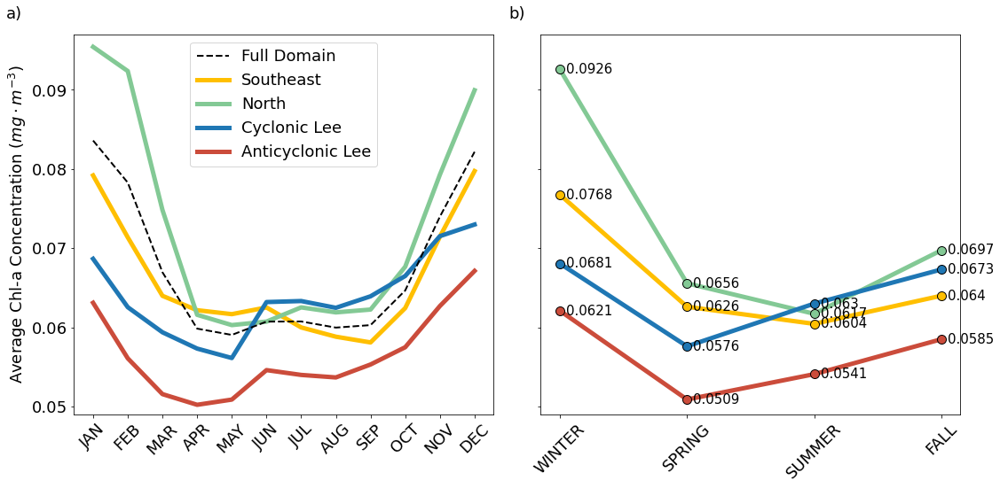

In [20]:
fig, ax = plt.subplots(1,2,figsize=(16,8))
plt.subplots_adjust(wspace=0.01) # make plots closer together

linewidth=5

ax[0].plot(monthly_mean,linewidth=linewidth-3,label='Full Domain',c='k',linestyle='--')
#ax[1].plot(all_seasonal_means,linewidth=linewidth-3,label='Full Domain',c='k',linestyle='--')

province_names = ['Southeast','North','Cyclonic Lee','Anticyclonic Lee']
province_colors = ['#ffbf00','#83c995','C0','#cb4c3b'] #yellow, green, blue, red
scat_size=100
for p in np.arange(0,4): 
    ax[0].plot(np.arange(0,12),all_province_monthly_means[p],linewidth=linewidth,label=province_names[p],c=province_colors[p],zorder=0)
    #ax[0].scatter(np.arange(0,12),all_province_monthly_means[p],facecolor=province_colors[p],edgecolor='k',s=scat_size)
    ax[1].plot(np.arange(0,4),all_province_seasonal_means[p],linewidth=linewidth,label=province_names[p],c=province_colors[p],zorder=0)
    ax[1].scatter(np.arange(0,4),all_province_seasonal_means[p],facecolor=province_colors[p],edgecolor='k',s=scat_size)

    for i in np.arange(0,4):
        ax[1].text(np.arange(0,4)[i]+0.05, all_province_seasonal_means[p][i], round(all_province_seasonal_means[p][i],4), ha='left', va='center',fontsize=15)
                   
ax[0].set_ylabel('Average Chl-a Concentration ($mg \cdot m^{-3}$)')
ax[0].set_xticks(np.arange(0,12))
ax[0].set_xticklabels(months,rotation=45)
ax[0].legend()

ax[1].set_xticks(np.arange(0,4))
ax[1].set_xticklabels(['WINTER','SPRING','SUMMER','FALL'],rotation=45)
ax[1].set_yticklabels([])

for a in [0,1]:
    ax[a].set_ylim([0.049,0.097])
    
ax[0].text(-2.5,0.099,'a)')
ax[1].text(-0.4,0.099,'b)')

fig.tight_layout()

save_dir = project_output_dir + 'RCLV_CHL_PAPER_FIGS/'
#plt.savefig(save_dir + 'monthly_mean_chl_by_province_r1.png', format='png', dpi=350)
#plt.show()

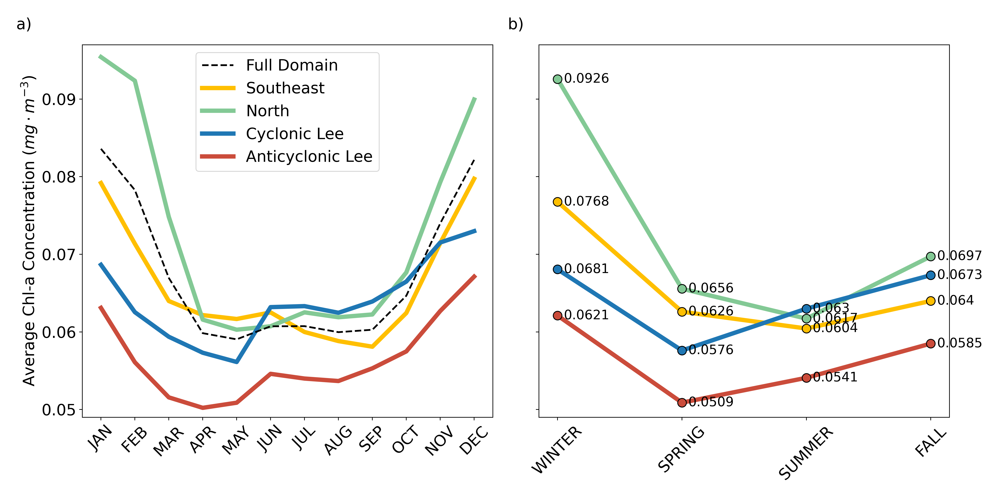

In [21]:
display(Image(filename=save_dir + 'monthly_mean_chl_by_province_r1.png'))